# 04. Свертки & сети

## План
0. Полносвязная сеть на MNIST (с прошлого семинара)
1. (DIY) Свертка
2. Сверточный слой
3. Сборка CNN
4. Обучение и результаты
5. (bonus) Различные способы организации слоев в pytorch

## 0. Пример с картинками: MNIST

Обучения на MNIST в курсе DL почти не избежать...

In [1]:
import os
import glob
import tqdm
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, IntSlider
from IPython.display import display
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn

%config InlineBackend.figure_format='retina'

In [2]:
#!pip install opencv-python
import cv2

MNIST - это ставший классикой датасет с изображениями рукописных цифр. На нем мы построим минимальный пример работы с изображениями.

В этот раз посмотрим сразу на функционал библиотеки `torchvision`.

In [3]:
import torchvision
from torchvision.datasets import MNIST
import torchvision.transforms as transforms

**NB:** можно было сделать парсинг файлов на диске через `glob.glob()`

In [4]:
train_dataset = MNIST(root="./", train=True, download=True, transform=transforms.ToTensor())
len(train_dataset)

60000

Посмотрим на сами данные из датасета:

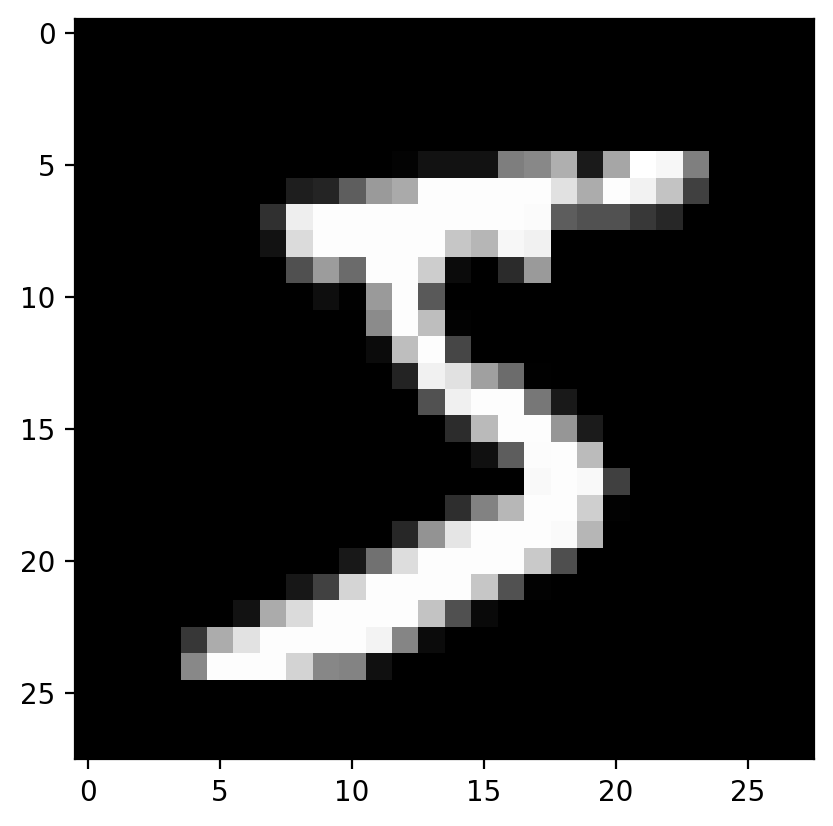

(torch.float32, torch.Size([1, 28, 28]))

In [5]:
image, label = train_dataset[0]
plt.imshow(image.permute(1, 2, 0), cmap="gray")
plt.show()
image.dtype, image.shape

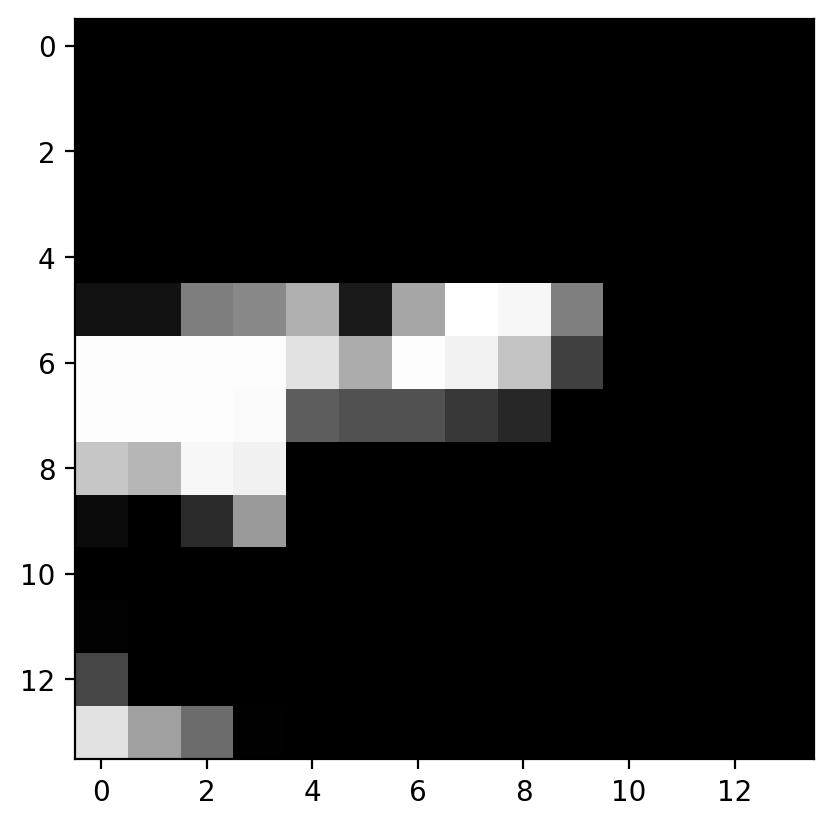

In [6]:
plt.imshow(image[:, :14, -14:].permute(1, 2, 0), cmap="gray")

Вспомогательная функция для массовой визуализации:

In [7]:
def show_images_with_captions(images, captions=None, ncol=8):
    nrow = len(images) // ncol

    plt.figure(figsize=(16, 16 * nrow // ncol))
    for i in range(len(images)):
        plt.subplot(nrow, ncol, i + 1)
        plt.imshow(images[i].permute(1, 2, 0), cmap="gray")
        if captions is not None:
            plt.title(captions[i])
        plt.grid(False)
        plt.axis(False)
    plt.show()

In [8]:
sample_indices = np.random.choice(len(train_dataset), size=64, replace=False)

sample_images = []
sample_captions = []
for i in sample_indices:
    image, label = train_dataset[i]
    sample_images.append(image)
    sample_captions.append(f"gt: {label}")

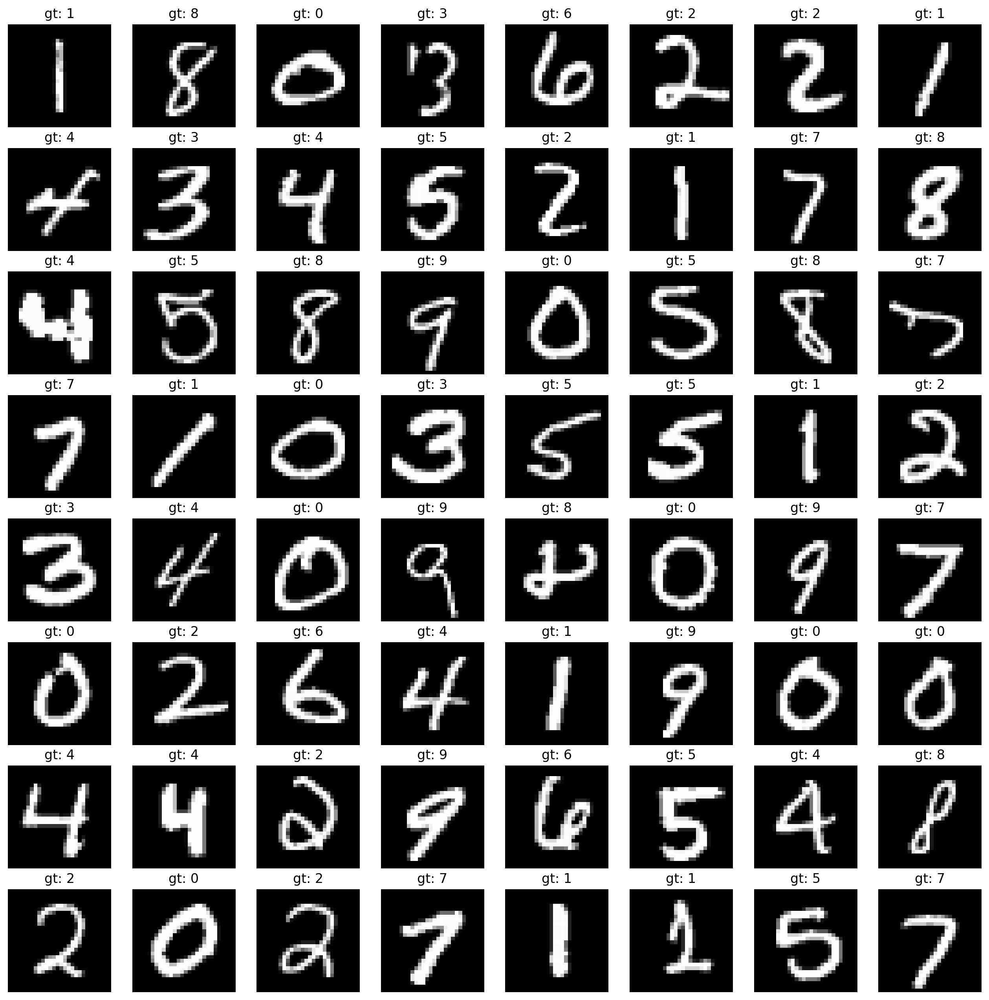

In [9]:
show_images_with_captions(sample_images, sample_captions)

Зарядим теперь обучение сети чуть глубже (3 слоя), да еще и с BatchNorm1d:

In [10]:
num_epochs = 10
batch_size = 100
lr = 3e-4

# Автоматический выбор устройства с приоритетом: MPS -> CUDA -> CPU
device = torch.device(
    "mps" if torch.backends.mps.is_available() and torch.backends.mps.is_built() else
    "cuda" if torch.cuda.is_available() else
    "cpu"
)

print(f"Используемое устройство: {device}")

Используемое устройство: mps


In [11]:
train_dataloader = DataLoader(
    dataset=train_dataset,
    batch_size=batch_size,
    num_workers=10,
    shuffle=True,
    drop_last=True,
)

val_dataset = MNIST("./", train=False, transform=transforms.ToTensor())
val_dataloader = DataLoader(
    dataset=val_dataset,
    batch_size=batch_size,
    num_workers=2,
    shuffle=False,
    drop_last=False,
)

**NB!** Если Вы дебажите сеть на произвольном input-е, обязательно переведите её в `eval()`. 

Пропускание случайного батча в `train()` моде чревато накоплением неправильных статистик и как следствие непредсказуемым поведением на ранних этапах обучения.

In [12]:
model = nn.Sequential(
    nn.Flatten(), # x.view(x.size(0), -1)
    nn.Linear(28 * 28, 512),
    nn.BatchNorm1d(512),
    nn.ReLU(inplace=True),
    nn.Linear(512, 1024),
    nn.BatchNorm1d(1024),
    nn.ReLU(inplace=True),
    nn.Linear(1024, 10),
)

In [13]:
model.training

True

In [14]:
model.eval()

model(torch.randn(5, 1, 28, 28)).shape

torch.Size([5, 10])

In [15]:
model.training

False

In [16]:
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
loss_fn = nn.CrossEntropyLoss()

Функции для обучения / валидации:

In [17]:
def train_epoch(model, dataloader, optimizer, loss_fn, epoch, device=device):
    model.train()
    model = model.to(device)

    losses = []
    for batch in dataloader:
        xs, ys_true = batch

        ys_pred = model(xs.to(device))
        loss = loss_fn(ys_pred, ys_true.to(device))
        loss.backward()

        optimizer.step()
        optimizer.zero_grad()

        losses.append(loss.cpu().item())

    return np.mean(losses)


def val_epoch(model, dataloader, loss_fn, device=device):
    model.eval()

    losses = []
    preds = []
    for batch in dataloader:
        xs, ys_true = batch
        with torch.no_grad():
            ys_pred = model(xs.to(device))

        loss = loss_fn(ys_pred, ys_true.to(device))
        losses.append(loss.item())

        preds.append(ys_pred.cpu().numpy())

    preds = np.concatenate(preds, axis=0)
    return np.mean(losses), preds

In [18]:
losses = []
val_losses = []
val_preds = []
for epoch in tqdm.trange(num_epochs):
    loss = train_epoch(model, train_dataloader, optimizer, loss_fn, epoch, device)
    losses.append(loss)

    val_loss, preds = val_epoch(model, val_dataloader, loss_fn)
    val_losses.append(val_loss)
    val_preds.append(preds)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [04:03<00:00, 24.31s/it]


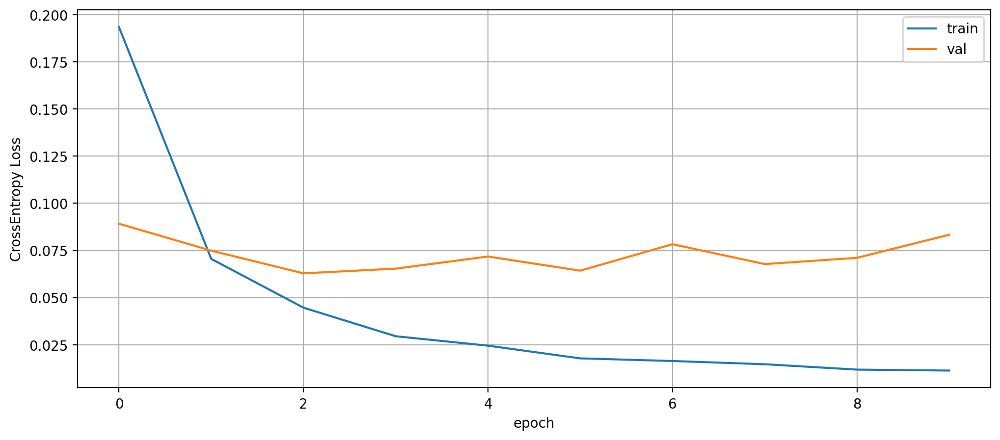

In [19]:
plt.figure(figsize=(12, 5))
plt.plot(losses, label="train")
plt.plot(val_losses, label="val")
plt.xlabel("epoch")
plt.ylabel("CrossEntropy Loss")
plt.legend()
plt.grid()
plt.show() # L1/L2 <-> Dropout <-> Data Augmentation


Соберем все предсказания / gt-лейблы, чтобы посчитать метрику Accuracy и сделать визуализацию:

In [20]:
val_pred_labels = []
for val_pred in val_preds[-1]:
    pred_label = np.argmax(val_pred)
    val_pred_labels.append(pred_label)
val_pred_labels = np.asarray(val_pred_labels)

In [21]:
val_labels = []
for image, label in val_dataset:
    val_labels.append(label)
val_labels = np.asarray(val_labels)

In [22]:
acc = (val_pred_labels == val_labels).mean()
acc

np.float64(0.9788)

Посмотрим, как соотносятся истинные лейблы и предсказанные моделью:

In [23]:
sample_indices = np.random.choice(len(val_dataset), size=64, replace=False)

sample_images = []
sample_captions = []
for i in sample_indices:
    image, label = val_dataset[i]
    pred_label = val_pred_labels[i]
    sample_images.append(image)
    sample_captions.append(f"gt: {label} | pred: {pred_label}")

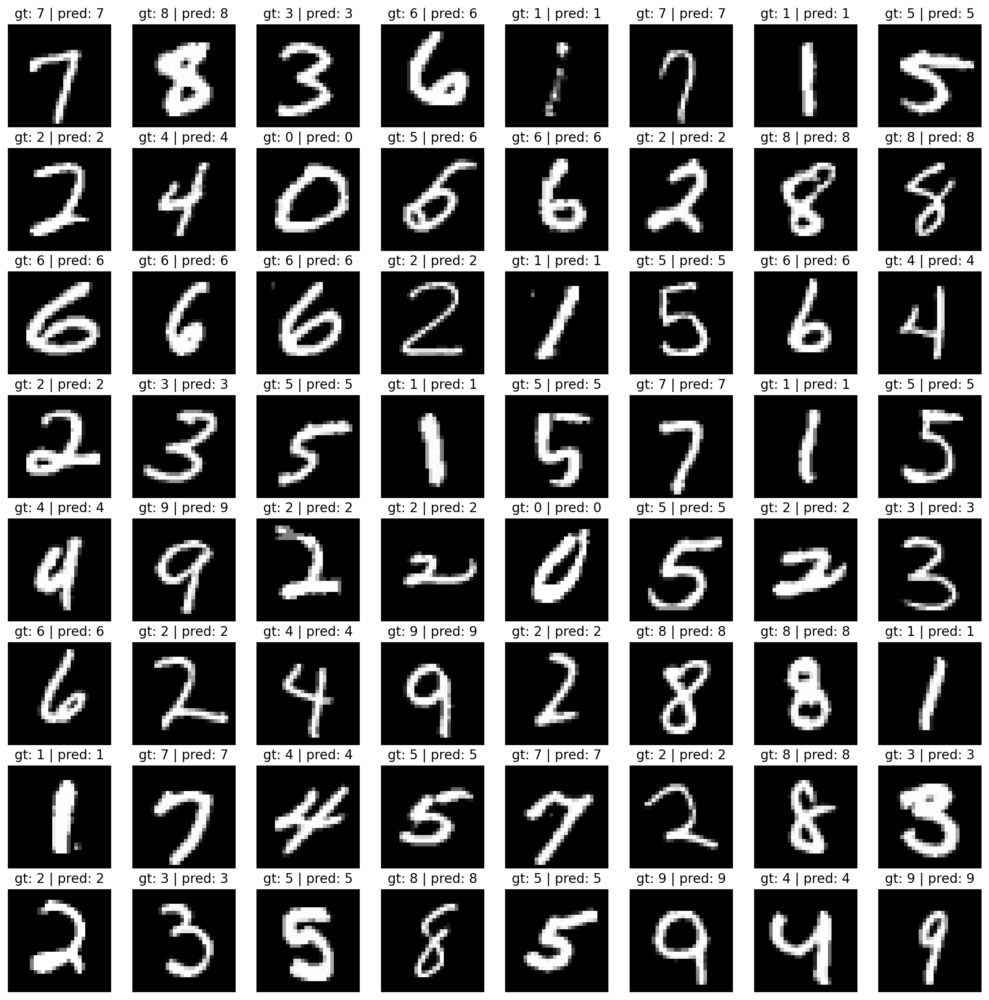

In [24]:
show_images_with_captions(sample_images, sample_captions)

Можем отдельно отрисовать те примеры из валидации, на которых модель ошибается:

In [25]:
sample_indices = np.random.choice(np.where(val_labels != val_pred_labels)[0], size=64, replace=False)

sample_images = []
sample_captions = []
for i in sample_indices:
    image, label = val_dataset[i]
    pred_label = val_pred_labels[i]
    sample_images.append(image)
    sample_captions.append(f"gt: {label} | pred: {pred_label}")

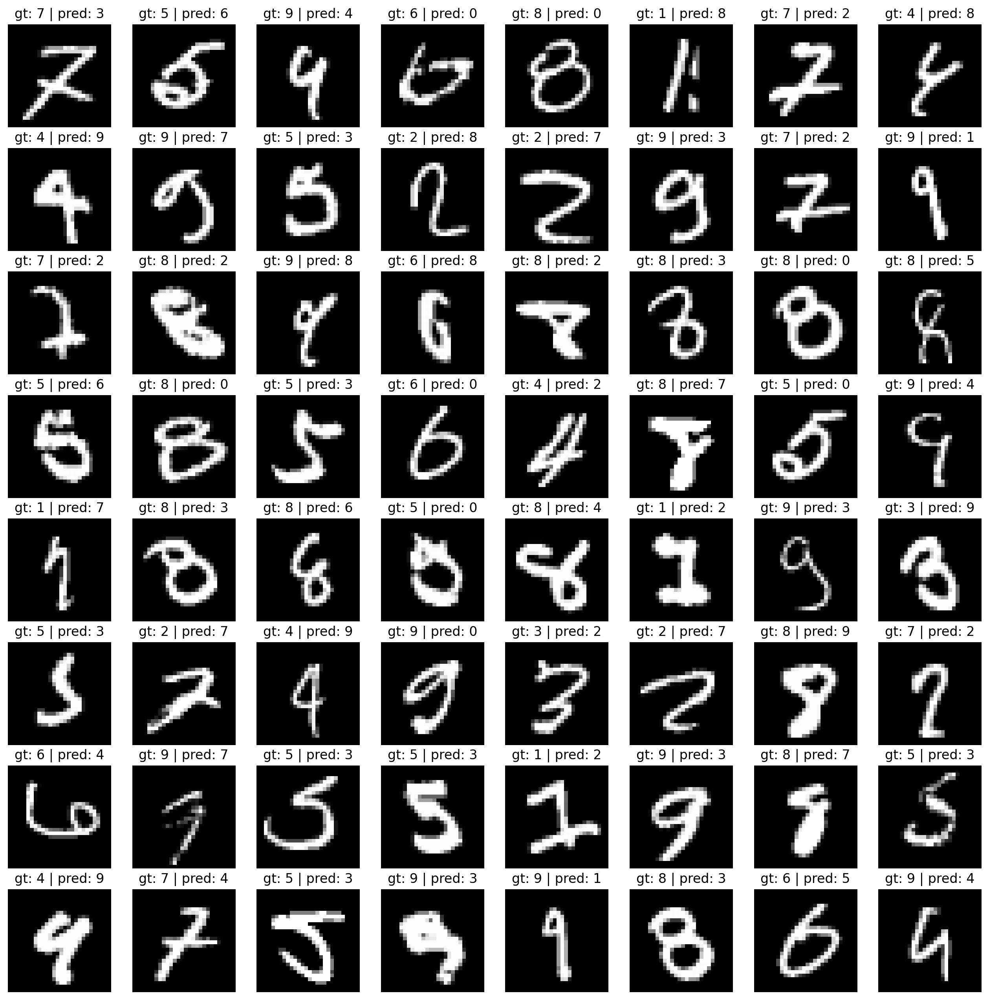

In [26]:
show_images_with_captions(sample_images, sample_captions)

In [27]:
print((val_labels != val_pred_labels).sum())

212


In [28]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

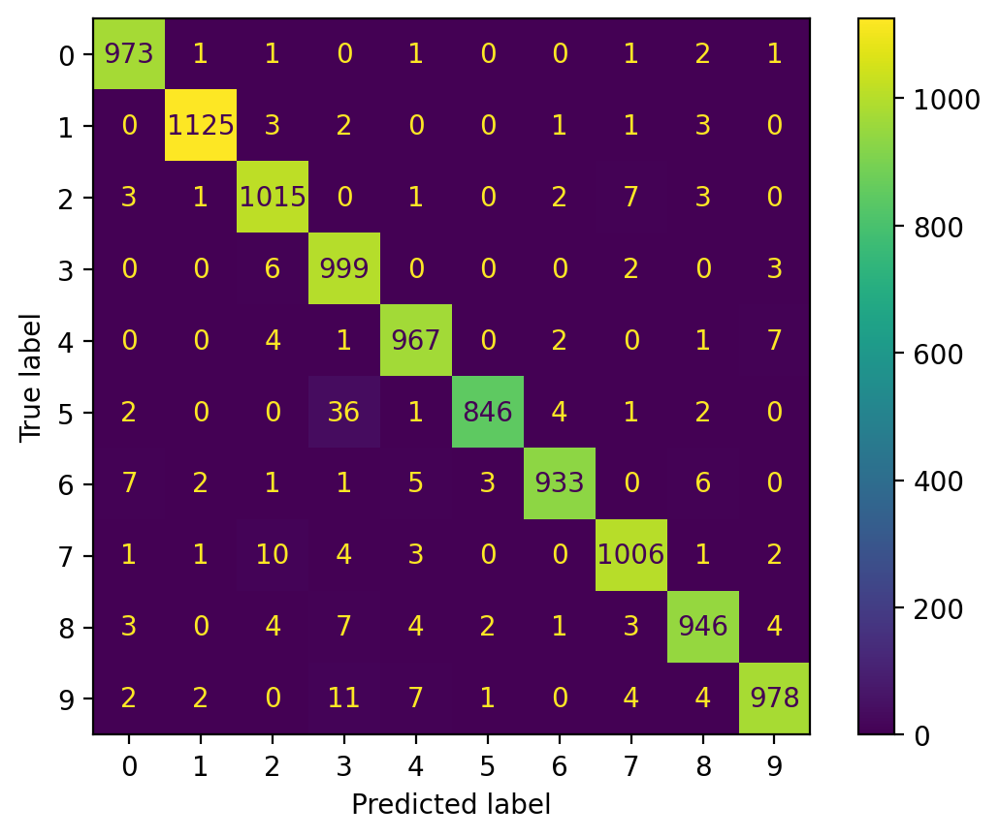

In [29]:
cm = confusion_matrix(val_labels, val_pred_labels)
disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
)
disp.plot();

## 1. Свертка

### 1.1. (DIY) Одномерная свертка

В этом блоке предлагается самостоятельно реализовать механизм одномерной свертки с поддержкой добавления паддинга.

[Материал по теме](https://github.com/hukenovs/dsp-theory/blob/master/src/dsp_theory_3_convolution.ipynb)

Важно отметить, что под свёрткой в Deep Learning подразумевают кросс-корреляцию, то есть свёртку исходного сигнала с перевёрнутым ядром. Здесь предлагается реализовать классическую свёртку:
$$(x * w)[j]= \sum_{i=-\infty}^{i=\infty} x[j-i] w[i]$$

**Задача**: реализовать функцию для добавления паддингов тремя способами:
* zero
* replicate
* reflect

<details>
<summary>Spoiler: эталонная реализация (сначала попробуйте сами!)</summary>

    
```python
def pad_1d(signal, size, kind):
    if kind == "zero":
        left_padding, right_padding = np.zeros(
            size,
            dtype=signal.dtype,
        ), np.zeros(
            size,
            dtype=signal.dtype,
        )
    elif kind == "replicate":
        left_padding, right_padding = np.repeat(signal[0], size), np.repeat(signal[-1], size)
    elif kind == "reflect":
        left_padding, right_padding = signal[size:0:-1], signal[-2 : -2 - size : -1]
    else:
        raise NotImplementedError(kind)
    signal_padded = np.concatenate([left_padding, signal, right_padding])

    return signal_padded
```
</details>

In [30]:
def pad_1d(signal, size, kind):
    if kind == "zero":
        left_padding, right_padding = np.zeros(
            size,
            dtype=signal.dtype,
        ), np.zeros(
            size,
            dtype=signal.dtype,
        )
    elif kind == "replicate":
        left_padding, right_padding = np.repeat(signal[0], size), np.repeat(signal[-1], size)
    elif kind == "reflect":
        left_padding, right_padding = signal[size:0:-1], signal[-2 : -2 - size : -1]
    else:
        raise NotImplementedError(kind)
    signal_padded = np.concatenate([left_padding, signal, right_padding])

    return signal_padded

In [31]:
signal = np.arange(10)
signal

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [32]:
np.testing.assert_array_equal(pad_1d(signal, 2, "zero"), np.array([0, 0, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 0, 0]))

In [33]:
np.testing.assert_array_equal(pad_1d(signal, 2, "replicate"), np.array([0, 0, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 9, 9]))

In [34]:
np.testing.assert_array_equal(pad_1d(signal, 2, "reflect"), np.array([2, 1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 8, 7]))

In [35]:
np.testing.assert_array_equal(pad_1d(signal, 0, "zero"), np.array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]))

**Задача**: реализовать (брутфорс) функцию вычисления свертки в одномерном случае с предварительным паддингом. 
<details>
<summary>Spoiler: эталонная реализация (сначала попробуйте сами!)</summary>

    
```python
def convolve_1d(signal, kernel, pad_size, pad_kind):
    signal_padded = pad_1d(signal, pad_size, pad_kind)
    kernel_size = kernel.shape[0]
    signal_padded_convolved = np.zeros(signal_padded.shape[0] - kernel_size + 1)
    for i in range(signal_padded.shape[0] - kernel_size + 1):
        signal_padded_convolved[i] = np.dot(signal_padded[i : i + kernel_size], kernel[::-1])
    return signal_padded_convolved
```
</details>

In [36]:
def convolve_1d(signal, kernel, pad_size, pad_kind):
    signal_padded = pad_1d(signal, pad_size, pad_kind)
    kernel_size = kernel.shape[0]
    signal_padded_convolved = np.zeros(signal_padded.shape[0] - kernel_size + 1)
    for i in range(signal_padded.shape[0] - kernel_size + 1):
        signal_padded_convolved[i] = np.dot(signal_padded[i : i + kernel_size], kernel[::-1])
    return signal_padded_convolved

In [37]:
signal = np.arange(10)
signal

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [38]:
kernel = np.asarray([0, 0, 0])
for pad_kind in ("zero", "replicate", "reflect"):
    np.testing.assert_array_equal(
        convolve_1d(signal, kernel, 1, pad_kind), np.array([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0])
    )

In [39]:
kernel = np.asarray([0, 1, 0])
for pad_kind in ("zero", "replicate", "reflect"):
    np.testing.assert_array_equal(convolve_1d(signal, kernel, 1, pad_kind), np.array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]))

Можно использовать полученную функцию свертки для фильтрации шумного одномерного сигнала:

In [40]:
eps = 1e-6


def sinc(x):
    return (np.sin(x) + eps) / (x + eps)

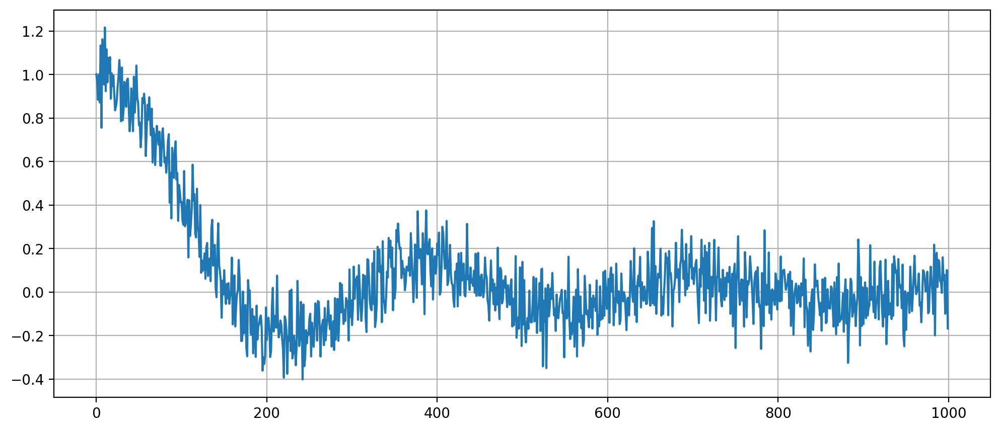

In [41]:
xs = np.linspace(0, 20, 1000)
signal = sinc(xs)
noise = np.random.normal(size=len(signal)) / 10
signal += noise

plt.figure(figsize=(12, 5))
plt.plot(signal)
plt.grid(True)
plt.show()

In [42]:
k = 51
p = k // 2
kernel = np.ones(k, dtype=np.float32) / k
signal_smoothed = convolve_1d(signal, kernel, p, "replicate")

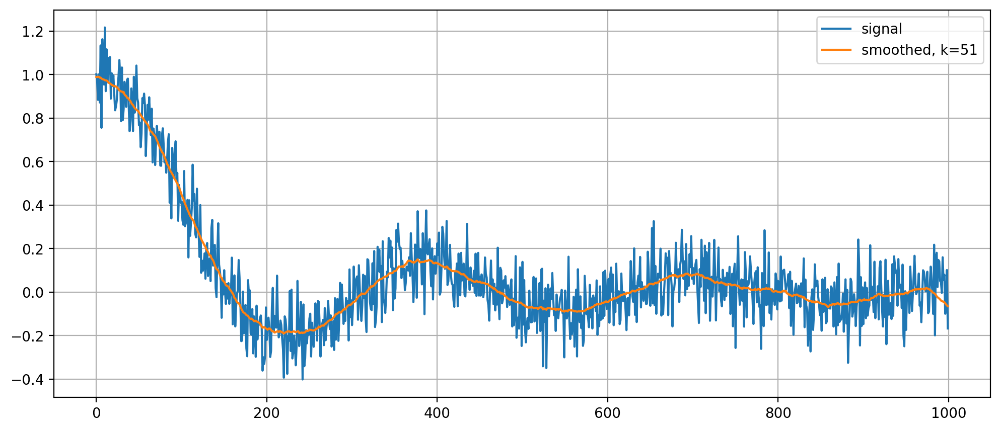

In [43]:
plt.figure(figsize=(12, 5))
plt.plot(signal, label="signal")
plt.plot(signal_smoothed, label=f"smoothed, k={k}")
plt.grid(True)
plt.legend()
plt.show()

### 1.2. Двумерная свертка

[Визуализация](https://animatedai.github.io/) выполнения агрегирующих операций над тензорами, [конструктор](https://ezyang.github.io/convolution-visualizer/) свёрток

Для демонстраций нам понадобится какая-нибудь картинка, скачаем ее (или любую другую):

In [44]:
!wget -O volleyball.jpeg https://img.olympicchannel.com/images/image/private/t_social_share_thumb/f_auto/primary/bwkrhsijg1gb4oxwc7zf

--2025-10-15 23:05:37--  https://img.olympicchannel.com/images/image/private/t_social_share_thumb/f_auto/primary/bwkrhsijg1gb4oxwc7zf
Resolving img.olympicchannel.com (img.olympicchannel.com)... 104.103.68.162, 104.103.68.161
Connecting to img.olympicchannel.com (img.olympicchannel.com)|104.103.68.162|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 152626 (149K) [image/jpeg]
Saving to: ‘volleyball.jpeg’

volleyball.jpeg     100%[===================>] 149,05K   243KB/s    in 0,6s    

2025-10-15 23:05:39 (243 KB/s) - ‘volleyball.jpeg’ saved [152626/152626]



In [45]:
image = cv2.imread("volleyball.jpeg", cv2.IMREAD_GRAYSCALE)
image.shape, image.dtype

((630, 1200), dtype('uint8'))

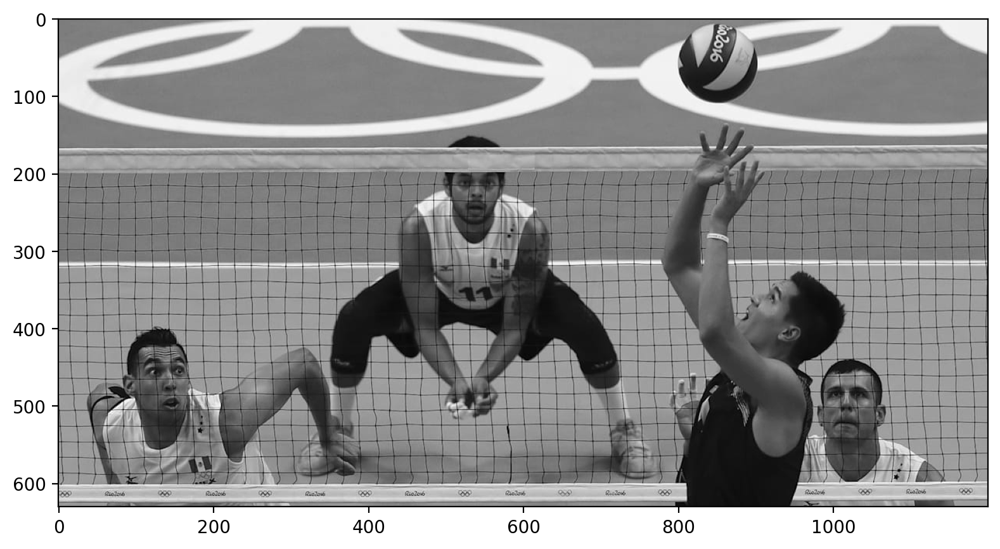

In [46]:
plt.figure(figsize=(12, 5))
plt.imshow(image, cmap="gray")

In [47]:
image = image.astype(np.float32) / 255.0

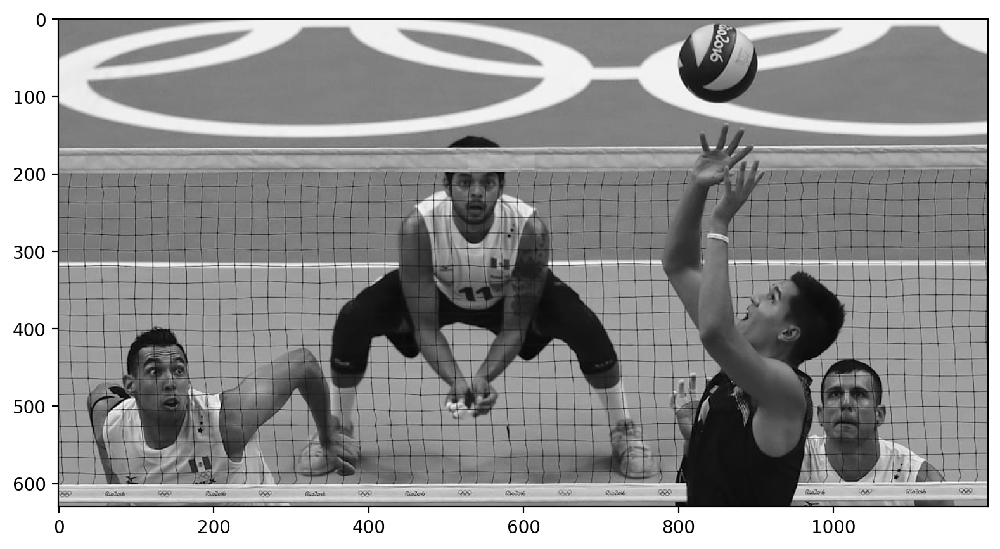

In [48]:
plt.figure(figsize=(12, 5))
plt.imshow(image, cmap="gray")

В OpenCV есть реализованный механизм свертки с заданным ядром. Используем его для того, чтобы применить к картинке операцию сглаживания ([box filter](https://en.wikipedia.org/wiki/Box_blur)):

Пример для матрицы $3 \times 3$
$$
\frac{1}{9} \begin{bmatrix} 1 & 1 & 1 \\ 1 & 1 & 1 \\ 1 & 1 & 1\end{bmatrix}
$$

In [49]:
k = 14

kernel = np.ones((k, k), dtype=np.float32) / (k * k)

In [50]:
image_conved = cv2.filter2D(image, -1, kernel)

In [51]:
image_conved.shape

(630, 1200)

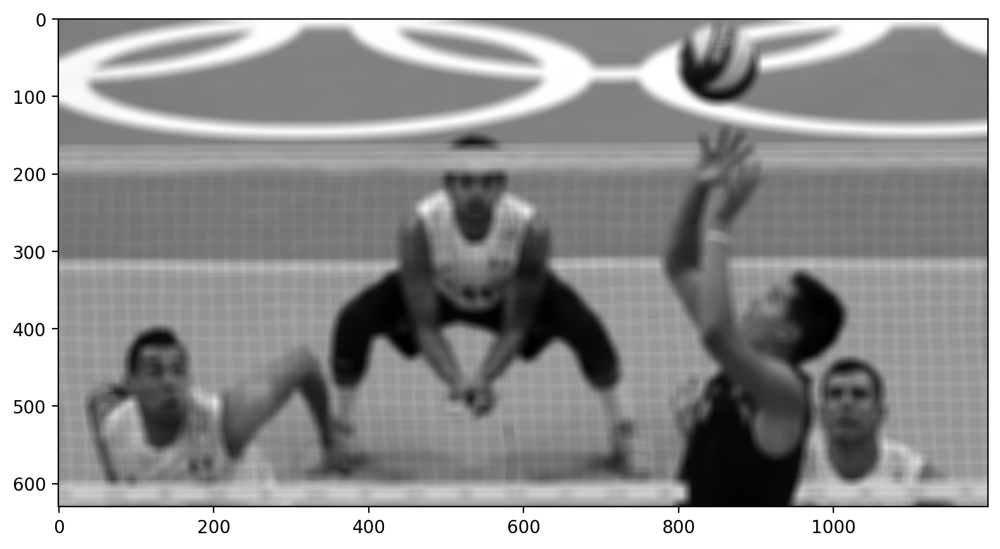

In [52]:
plt.figure(figsize=(12, 5))
plt.imshow(image_conved, cmap="gray")

## 2. Сверточный слой

OpenCV предоставляет функцию для свертки с заданным ядром. Но нам-то нужны обучаемые свертки!

In [53]:
conv = nn.Conv2d(in_channels=1, 
                 out_channels=1,
                 kernel_size=5,
                 padding=0,
                 stride=1)
conv

Conv2d(1, 1, kernel_size=(5, 5), stride=(1, 1))

**Веса:** Инициализируются случайно из равномерного распределения Kaiming

**Bias:** Также инициализируется случайно (если bias=True, что по-умолчанию)

In [54]:
conv.weight.shape  # == out_channels, in_channels, k, k

torch.Size([1, 1, 5, 5])

Очень хочется применить этот слой к нашему изображению:

In [55]:
# conv(image)

Конечно же, чтобы пользоваться методами и классами из pytorch, надо обернуть данные в `torch.Tensor`.

* **NB**: помним о том, что картинки размером (h, w, 1) `matplotlib` не поймет - либо "серые" (h, w), либо цветные (h, w, 3) (либо вообще (h, w, 4), если с прозрачностью).

In [56]:
def image_to_tensor(image):
    if image.ndim == 2:
        image = image[:, :, np.newaxis]
    if image.dtype == np.uint8:
        image = image.astype(np.float32) / 255.0

    tensor = torch.from_numpy(image)
    tensor = tensor.permute(2, 0, 1).unsqueeze(0)

    return tensor


def tensor_to_image(tensor):
    image = tensor[0].permute(1, 2, 0).numpy()
    if image.shape[-1] == 1:
        image = image[:, :, 0]
    return image

In [57]:
tensor = image_to_tensor(image)
tensor.shape

torch.Size([1, 1, 630, 1200])

Теперь можно отправить тензор с нашим изображением в слой:

In [58]:
y = conv(tensor)
y.shape

torch.Size([1, 1, 626, 1196])

In [59]:
def apply_convolution(kernel_size):
    # Применяем свертку с выбранным размером ядра
    conv = nn.Conv2d(
        in_channels=1, 
        out_channels=1, 
        kernel_size=kernel_size, 
        padding=0,  # Можно изменить на padding='same' для сохранения размера
        bias=False  # Упрощаем визуализацию
    )
    
    # Инициализируем веса для воспроизводимости (опционально)
    with torch.no_grad():
        conv.weight.fill_(1.0 / (kernel_size * kernel_size))
    
    y = conv(tensor)
    image_conved = tensor_to_image(y.detach())
    
    # Визуализация
    plt.figure(figsize=(10, 5))
    plt.imshow(image_conved, cmap='gray')
    plt.title(f'Размер ядра: {kernel_size}x{kernel_size}\nРазмер выхода: {image_conved.shape}')
    plt.axis('off')
    plt.show()
    
    
interact(
    apply_convolution, 
    kernel_size=IntSlider(
        value=1,
        min=1,
        max=64,
        step=1,
        continuous_update=False,  # Обновлять только при отпускании ползунка
        description='Размер ядра:'
    )
);

interactive(children=(IntSlider(value=1, continuous_update=False, description='Размер ядра:', max=64, min=1), …

(634, 1204)
(658, 1228)
(754, 1324)
(882, 1452)


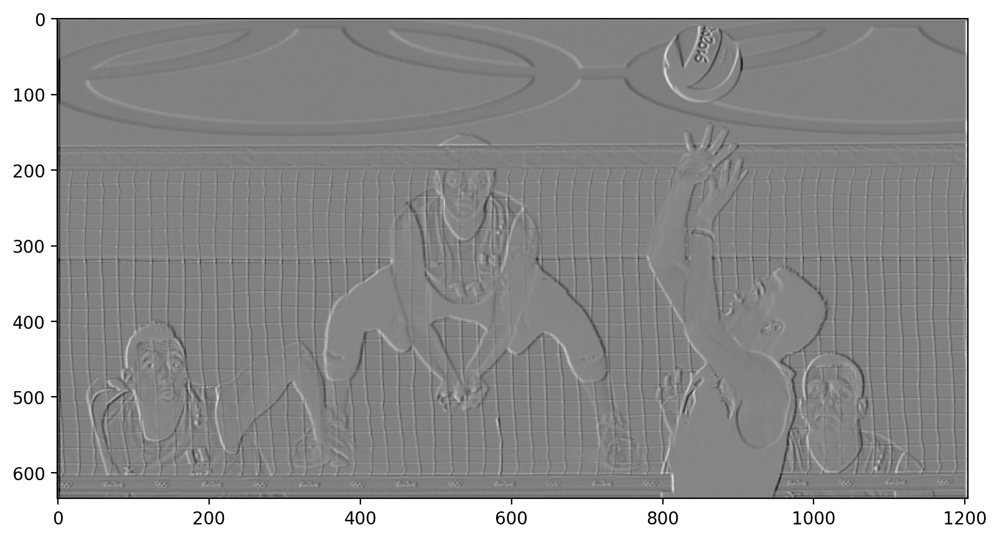

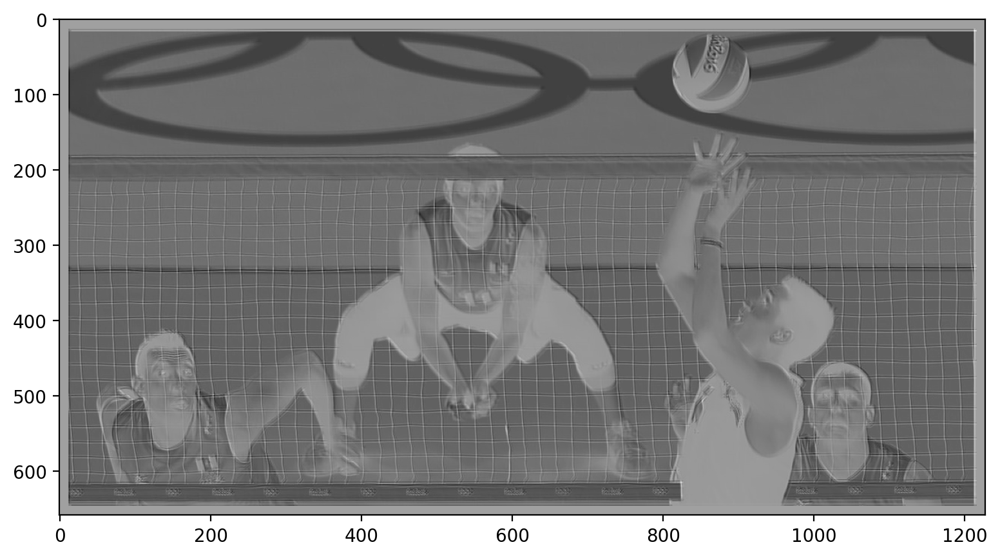

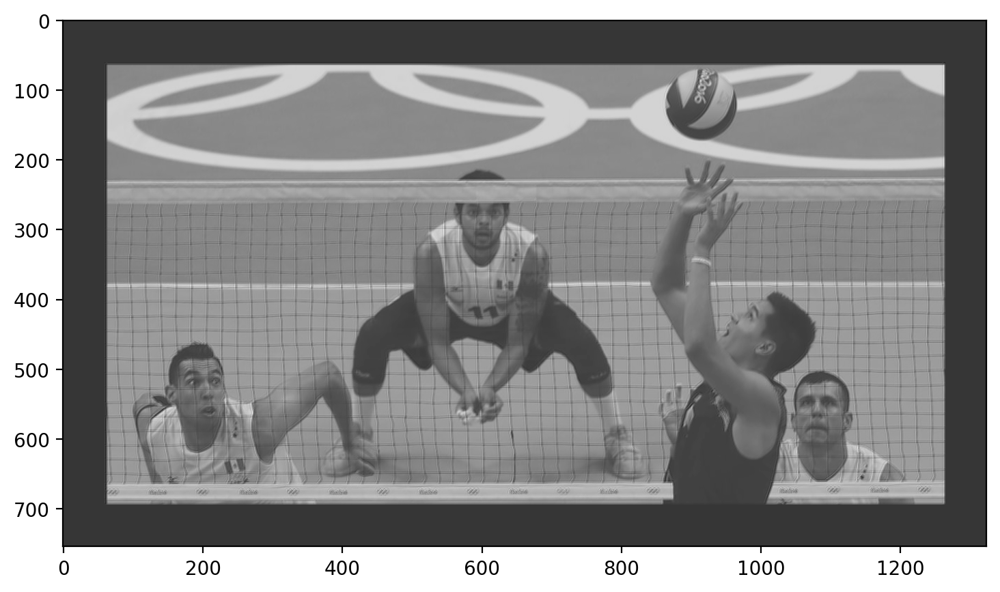

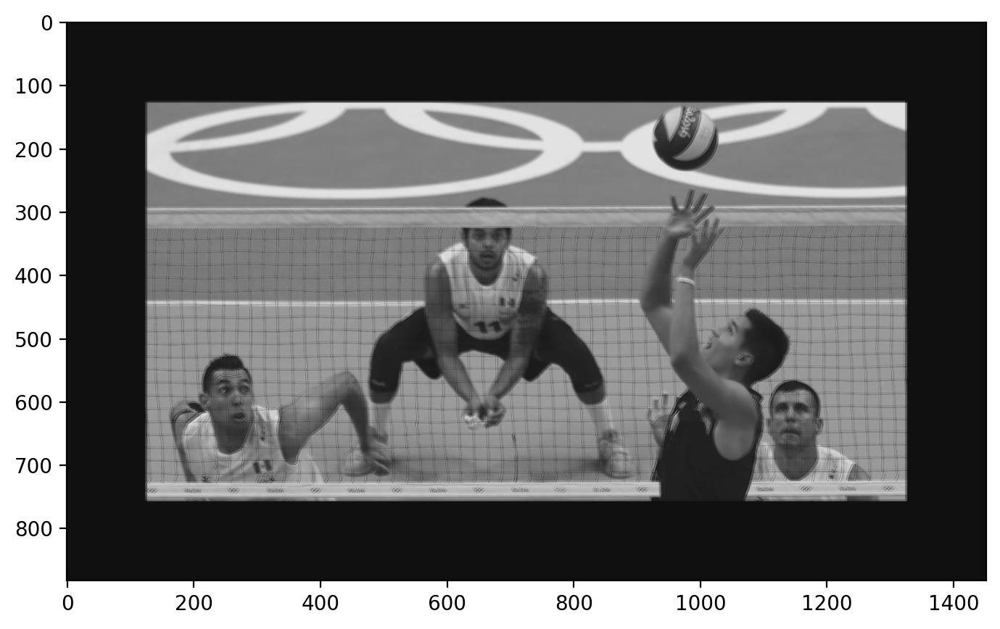

In [60]:
for padding in [4, 16, 64, 128]:
    conv = nn.Conv2d(in_channels=1, out_channels=1, kernel_size=5, padding=padding)
    y = conv(tensor)
    image_conved = tensor_to_image(y.detach())

    print(image_conved.shape)

    plt.figure(figsize=(12, 5))
    plt.imshow(image_conved, cmap="gray")

(630, 1200)
(315, 600)
(158, 300)
(32, 60)


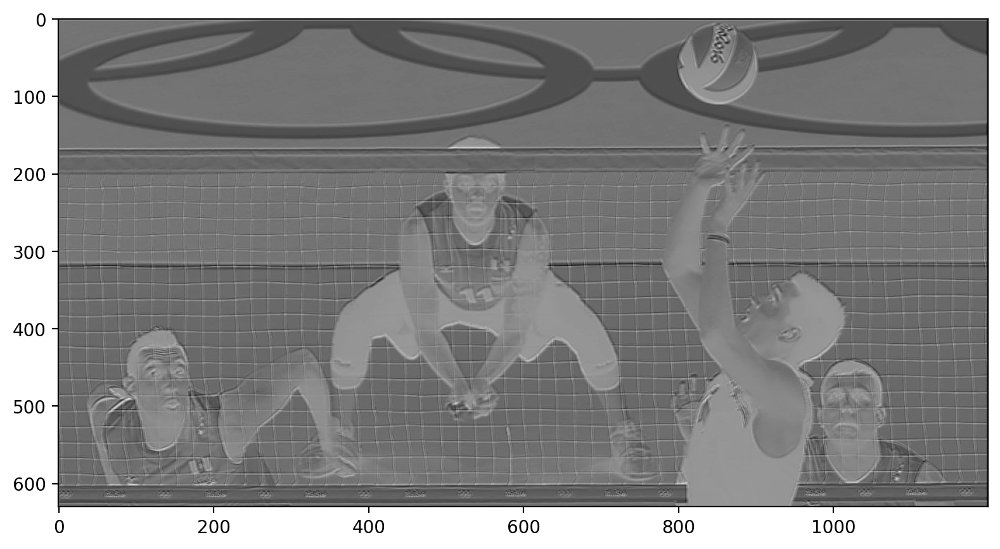

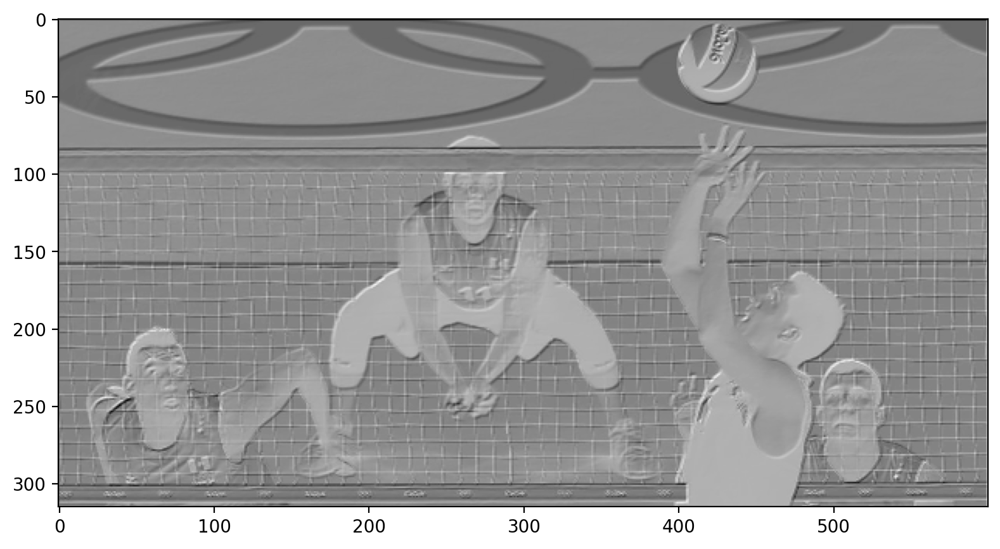

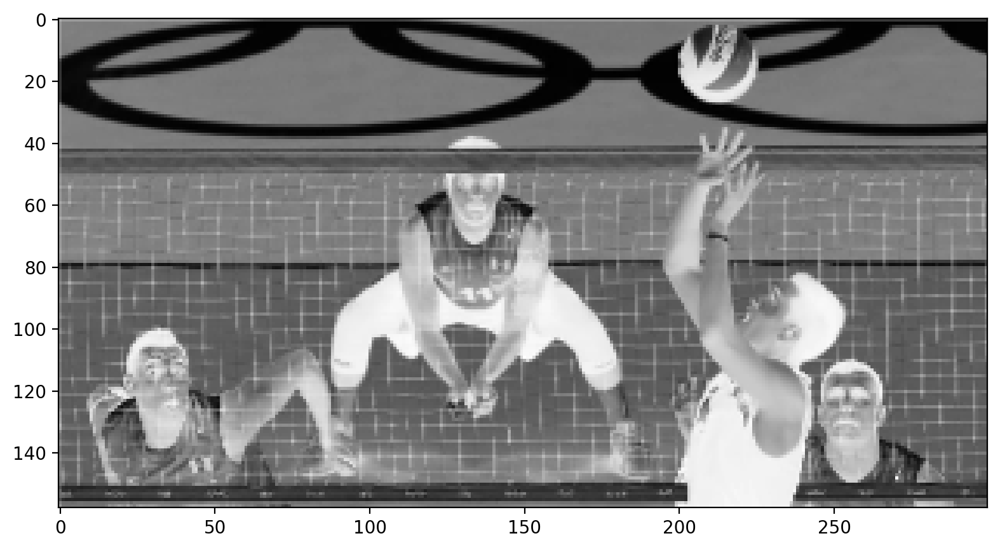

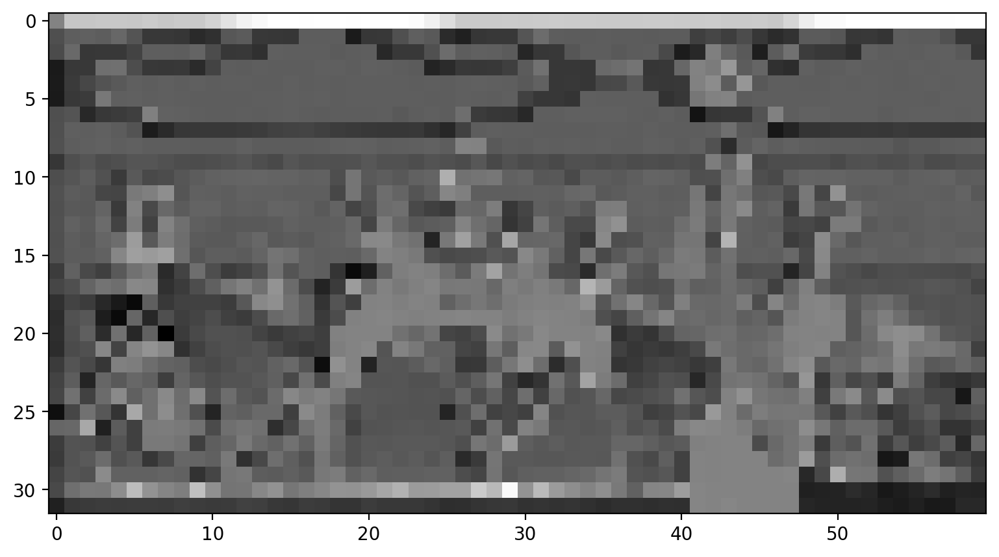

In [61]:
for stride in [1, 2, 4, 20]:
    conv = nn.Conv2d(in_channels=1, out_channels=1, kernel_size=5, padding=2, stride=stride)
    y = conv(tensor)
    image_conved = tensor_to_image(y.detach())

    print(image_conved.shape)

    plt.figure(figsize=(12, 5))
    plt.imshow(image_conved, cmap="gray")

Повторим наш трюк с реализацией `box filter`, но теперь "записав" наше ядро в веса сверточного слоя `Conv2d`:

In [62]:
k = 16
p = 0

conv = nn.Conv2d(
    in_channels=1,
    out_channels=1,
    kernel_size=k,
    padding=p,
)
conv.requires_grad_(False)

Conv2d(1, 1, kernel_size=(16, 16), stride=(1, 1))

In [63]:
conv.weight[0] = 1 / (k * k)
conv.bias.data = torch.zeros_like(conv.bias.data)

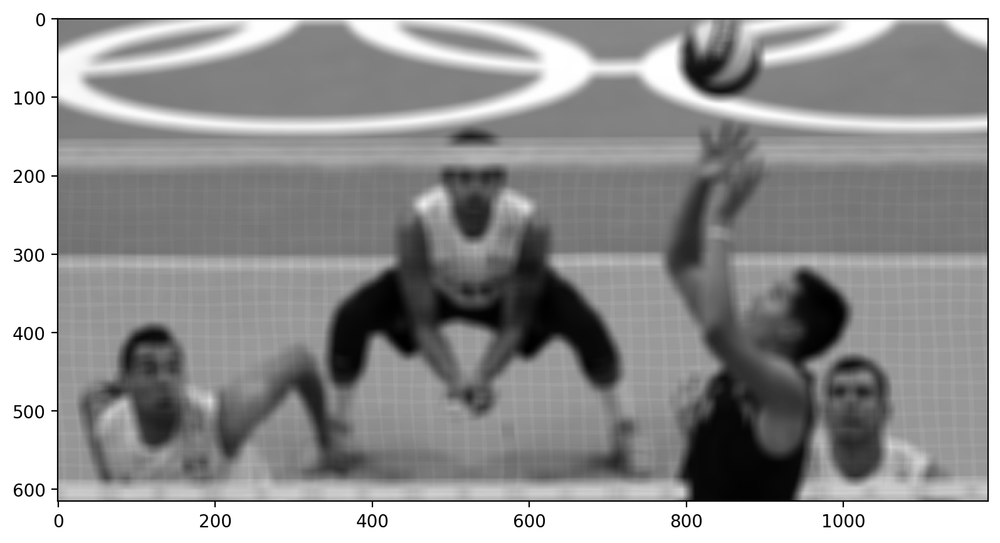

In [64]:
y = conv(tensor)

plt.figure(figsize=(12, 5))
plt.imshow(tensor_to_image(y), cmap="gray")
plt.show()

`torch.nn.AvgPool2d` суть тот же box-фильтр, но со страйдом, равным размеру фильтра!

In [65]:
k = 16
p = 0

conv = nn.Conv2d(in_channels=1, out_channels=1, kernel_size=k, padding=p, stride=k)
conv.requires_grad_(False)

Conv2d(1, 1, kernel_size=(16, 16), stride=(16, 16))

In [66]:
conv.weight[0] = 1 / (k * k)
conv.bias.data = torch.zeros_like(conv.bias.data)

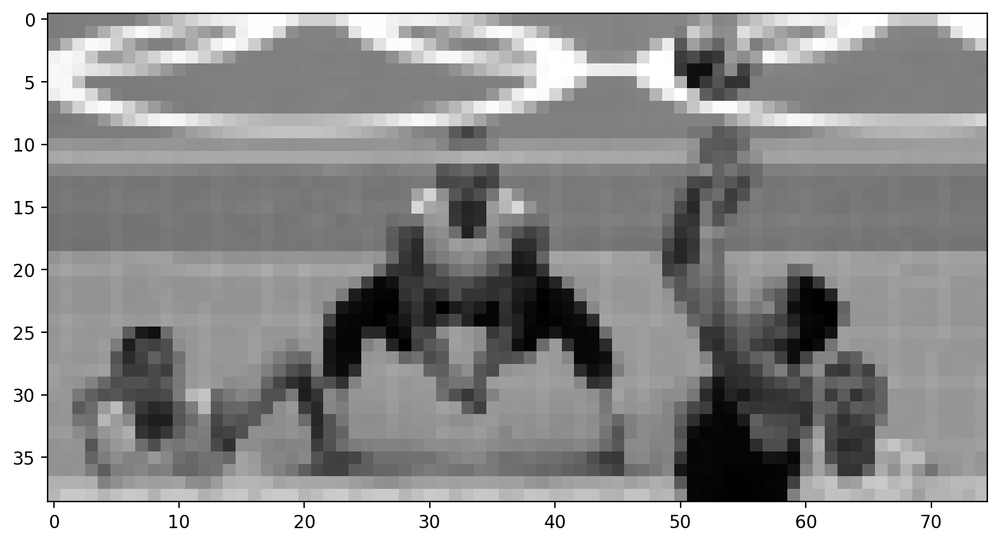

In [67]:
y = conv(tensor)

plt.figure(figsize=(12, 5))
plt.imshow(tensor_to_image(y), cmap="gray")
plt.show()

Ещё пример: [фильтр Собеля](https://en.wikipedia.org/wiki/Sobel_operator) для выделения границ изображения (суть дискретный градиент по пикселям).

In [68]:
sobel_x_kernel = np.array([[-1.0, 0.0, 1.0], [-2.0, 0.0, 2.0], [-1.0, 0.0, 1.0]])
sobel_y_kernel = sobel_x_kernel.T
sobel_x_kernel, sobel_y_kernel

(array([[-1.,  0.,  1.],
        [-2.,  0.,  2.],
        [-1.,  0.,  1.]]),
 array([[-1., -2., -1.],
        [ 0.,  0.,  0.],
        [ 1.,  2.,  1.]]))

In [69]:
k = 3
p = 0

conv = nn.Conv2d(
    in_channels=1,
    out_channels=1,
    kernel_size=k,
    padding=p,
)
conv.requires_grad_(False)

Conv2d(1, 1, kernel_size=(3, 3), stride=(1, 1))

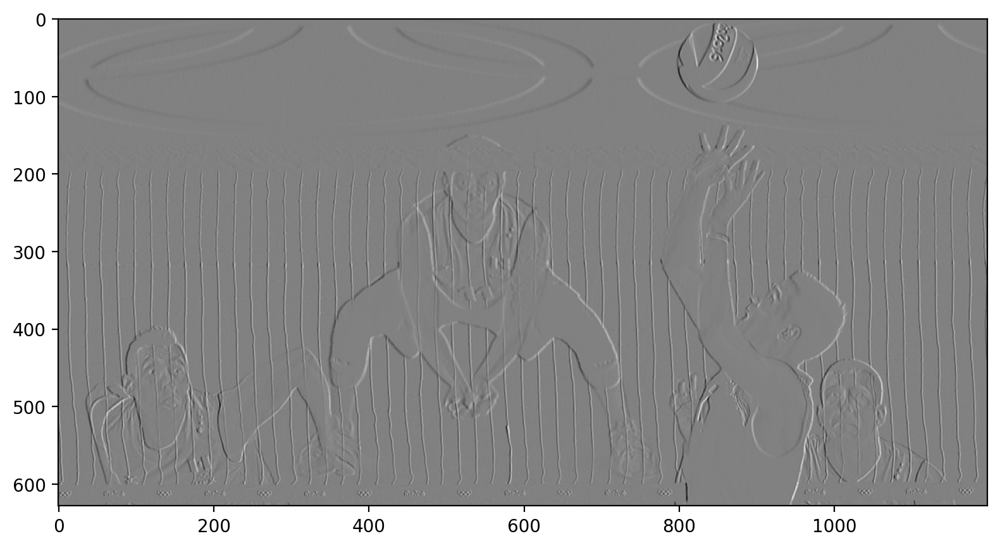

In [70]:
conv.weight.data = torch.from_numpy(sobel_x_kernel).float().view(1, 1, 3, 3)  # n_out x n_in x k x k
conv.bias.data = torch.zeros_like(conv.bias.data)

y = conv(tensor)

plt.figure(figsize=(12, 5))
plt.imshow(tensor_to_image(y), cmap="gray")
plt.show()

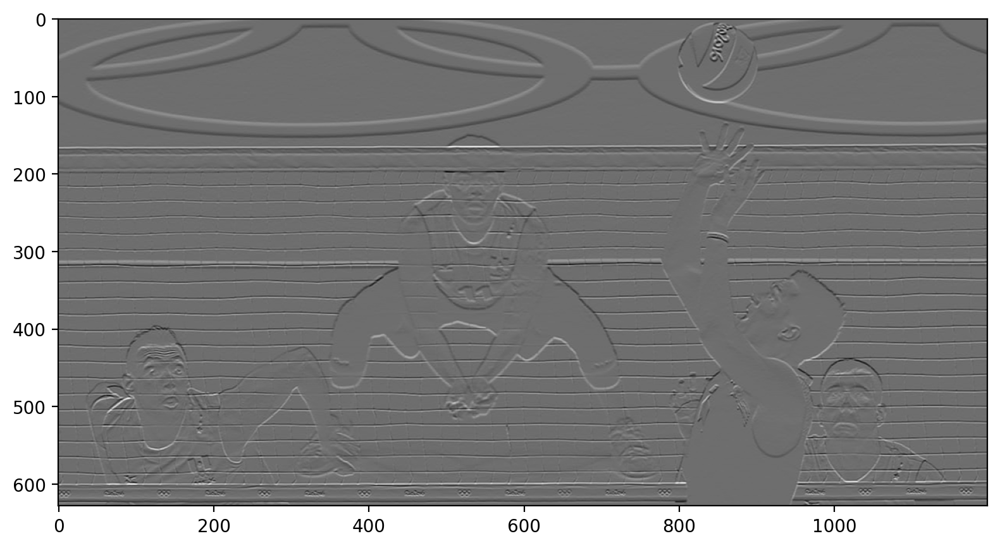

In [71]:
conv.weight.data = torch.from_numpy(sobel_y_kernel).float().view(1, 1, 3, 3)  # n_out x n_in x k x k
conv.bias.data = torch.zeros_like(conv.bias.data)

y = conv(tensor)

plt.figure(figsize=(12, 5))
plt.imshow(tensor_to_image(y), cmap="gray")
plt.show()

Чтобы получить полный градиент по x- и y- координате, просто сконкатенируем два фильтра и возьмём среднее от результатов:

In [72]:
k = 3
p = 0

conv = nn.Conv2d(
    in_channels=1,
    out_channels=2,
    kernel_size=k,
    padding=p,
)
conv.requires_grad_(False)

Conv2d(1, 2, kernel_size=(3, 3), stride=(1, 1))

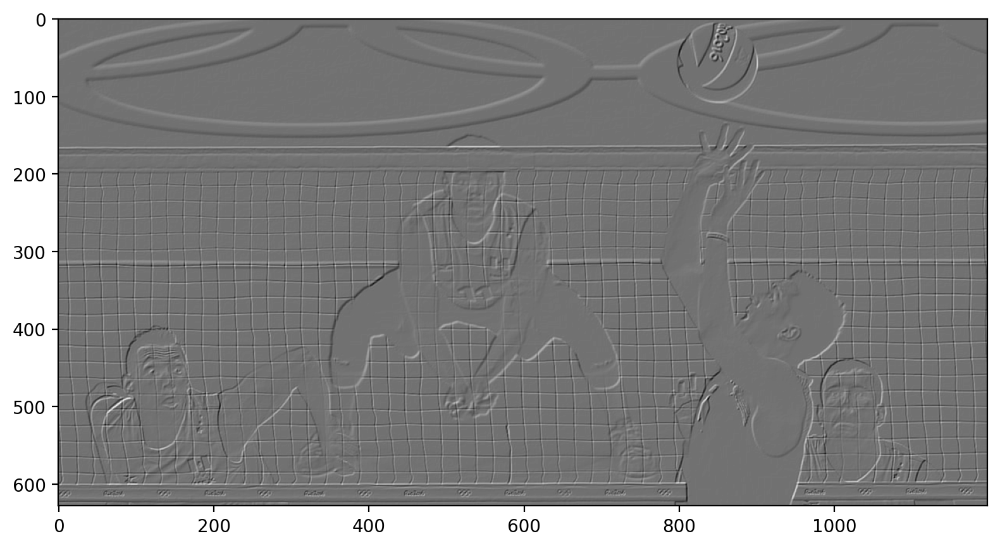

In [73]:
conv.weight.data = (
    torch.from_numpy(np.concatenate([sobel_x_kernel, sobel_y_kernel])).float().view(2, 1, 3, 3)
)  # n_out x n_in x k x k
conv.bias.data = torch.zeros_like(conv.bias.data)

y = conv(tensor).sum(dim=1, keepdims=True)

plt.figure(figsize=(12, 5))
plt.imshow(tensor_to_image(y), cmap="gray")
plt.show()

Сверткам из 1 канала в 1 сыт не будешь - в современных моделях характерные глубины тензоров ~ 32, 64, 128, 256, 512, 1024, ...

In [74]:
image = cv2.imread("volleyball.jpeg")
image.shape, image.dtype

((630, 1200, 3), dtype('uint8'))

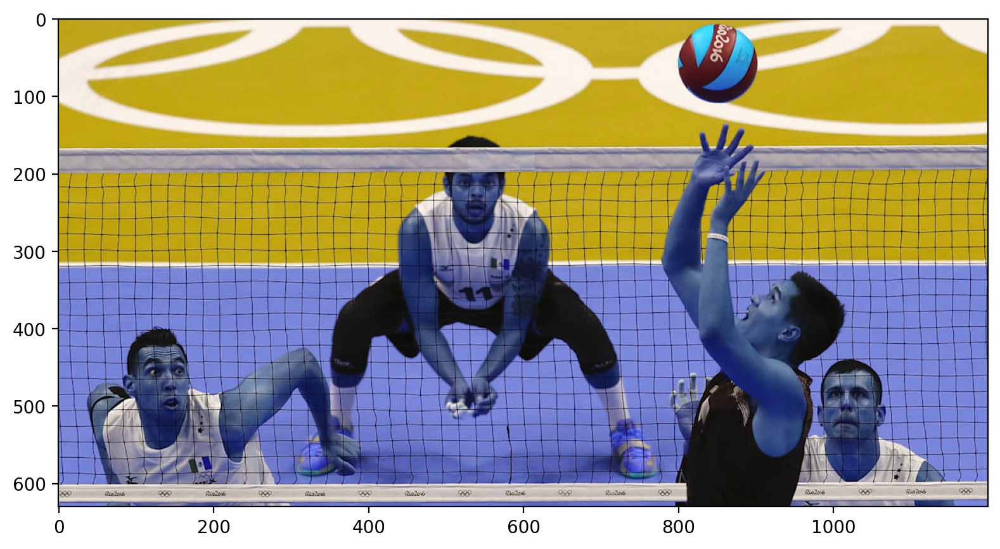

In [75]:
plt.figure(figsize=(12, 5))
plt.imshow(image)

Неприятная вещь в `opencv` - по умолчанию изображения считываются в формате BGR вместо RGB. `matplotlib` к такому не готов и ждет изображения в RGB. Для этого придется делать конвертацию вручную:

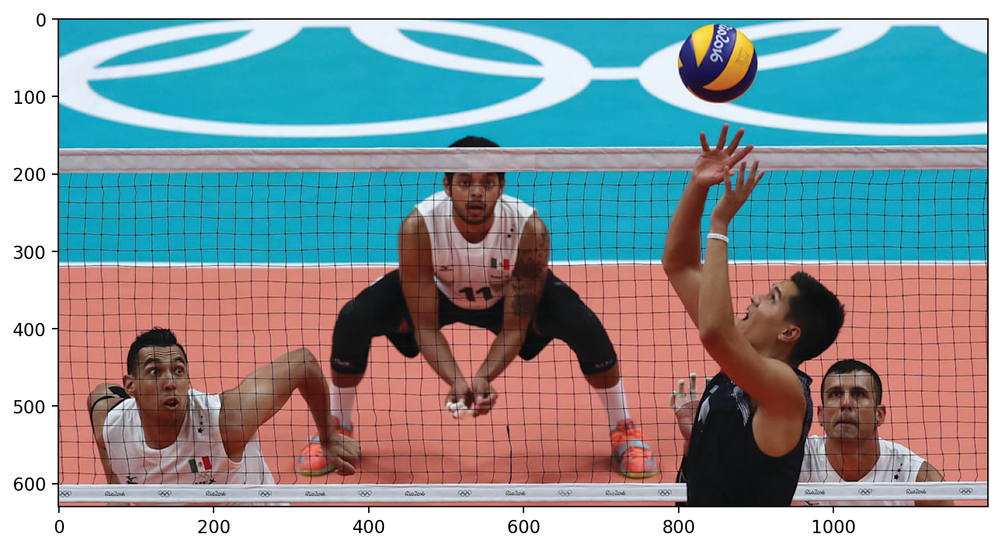

In [76]:
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 5))
plt.imshow(image)

[*BGR was a choice made for historical reasons and now we have to live with it. In other words, BGR is the horse’s ass in OpenCV.*](https://learnopencv.com/why-does-opencv-use-bgr-color-format/)

Теперь у нашего тензора будет 3 канала, надо учесть это при создании сверточного слоя:

In [77]:
conv = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=(1, 7), padding=2)

conv

Conv2d(3, 16, kernel_size=(1, 7), stride=(1, 1), padding=(2, 2))

In [78]:
conv.weight.shape

torch.Size([16, 3, 1, 7])

In [79]:
x = image_to_tensor(image)
x.shape

torch.Size([1, 3, 630, 1200])

In [80]:
y = conv(x)
y.shape

torch.Size([1, 16, 634, 1198])

**Задание**: реализуйте сверточный слой (со сверткой размера 1х1), который изменит порядок следования каналов в тензоре глубины 3 на противоположный.

In [81]:
def create_channels_permutator():
    # YOUR CODE HERE

    # conv =
    conv = nn.Conv2d(in_channels=3, out_channels=3, kernel_size=1, padding=0, bias=False)
    conv.requires_grad_(False)
    conv.weight.data = torch.flip(torch.eye(3), (0,)).view(3, 3, 1, 1)

    # END OF YOUR CODE

    return conv

In [82]:
permutator = create_channels_permutator()
with torch.no_grad():
    x_permuted = permutator(x)

for i in range(3):
    np.testing.assert_array_equal(x[0, i].numpy(), x_permuted[0, -i - 1].numpy())

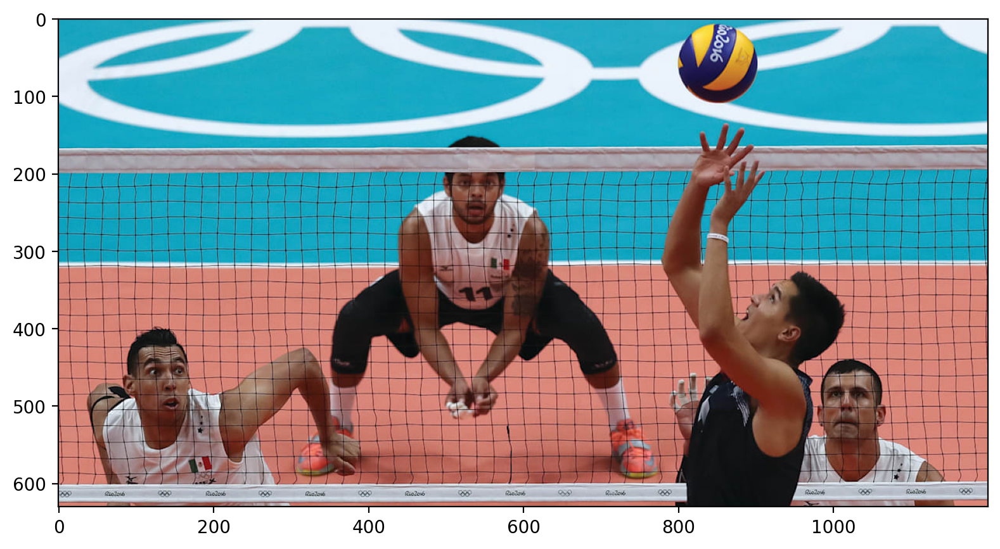

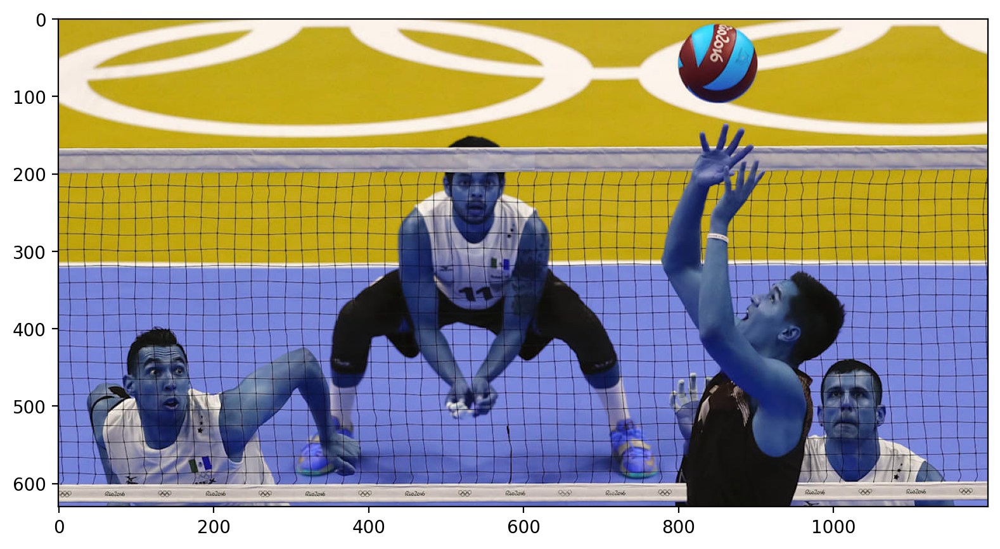

In [83]:
plt.figure(figsize=(12, 5))
plt.imshow(tensor_to_image(x))

plt.figure(figsize=(12, 5))
plt.imshow(tensor_to_image(x_permuted))

## 3. Сборка CNN

Теперь, когда мы познакомились со сверточными слоями, пришла пора собрать нейросеть на их основе.

Кроме сверточных слоев нам пригодятся пулинги:

In [84]:
x = torch.randn(1, 3, 32, 32)

In [85]:
max_pool2d = nn.MaxPool2d((2, 4))
max_pool2d(x).shape

torch.Size([1, 3, 16, 8])

In [86]:
avg_pool2d = nn.AvgPool2d((2, 2))
avg_pool2d(x).shape

torch.Size([1, 3, 16, 16])

И еще два важных слоя:
* `BatchNorm2d` для батч-нормализации
* `Flatten` для "вытягивания" тензора в вектор (для финальной классификации)

In [87]:
bn = nn.BatchNorm2d(3)
bn(x).shape

torch.Size([1, 3, 32, 32])

In [88]:
flatten = nn.Flatten()
flatten(x).shape

torch.Size([1, 3072])

Собираем (с параметрами для датасета MNIST):

In [89]:
my_cnn = nn.Sequential(  # b x 1 x 28 x 28
    nn.Conv2d(1, 8, (3, 3), 1, 1),  # b x 8 x 28 x 28
    nn.BatchNorm2d(8),  # ...
    nn.ReLU(inplace=True),  # ...
    nn.MaxPool2d((2, 2)),  # b x 8 x 14 x 14
    nn.Conv2d(8, 32, (3, 3), 1, 1),  # b x 32 x 14 x 14
    nn.BatchNorm2d(32),  # ...
    nn.ReLU(inplace=True),  # ...
    nn.MaxPool2d((2, 2)),  # b x 32 x 7 x 7
    nn.Conv2d(32, 64, (3, 3), 1, 1),  # b x 64 x 7 x 7
    nn.ReLU(inplace=True),  # ...
    nn.AvgPool2d((7, 7)),  # b x 64 x 1 x 1
    nn.Flatten(),  # b x 64
    nn.Linear(64, 10),  # b x 10
)

In [90]:
my_cnn.eval()

Sequential(
  (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (4): Conv2d(8, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (6): ReLU(inplace=True)
  (7): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (8): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (9): ReLU(inplace=True)
  (10): AvgPool2d(kernel_size=(7, 7), stride=(7, 7), padding=0)
  (11): Flatten(start_dim=1, end_dim=-1)
  (12): Linear(in_features=64, out_features=10, bias=True)
)

In [91]:
x = torch.randn(4, 1, 28, 28)

In [92]:
my_cnn(x).shape

torch.Size([4, 10])

## 4. Обучение

In [93]:
optimizer = torch.optim.Adam(my_cnn.parameters(), lr=lr)
loss_fn = nn.CrossEntropyLoss()

In [94]:
losses = []
val_losses = []
val_preds = []
for epoch in tqdm.trange(num_epochs):
    loss = train_epoch(my_cnn, train_dataloader, optimizer, loss_fn, epoch, device)
    losses.append(loss)

    val_loss, preds = val_epoch(my_cnn, val_dataloader, loss_fn, device)
    val_losses.append(val_loss)
    val_preds.append(preds)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [05:56<00:00, 35.68s/it]


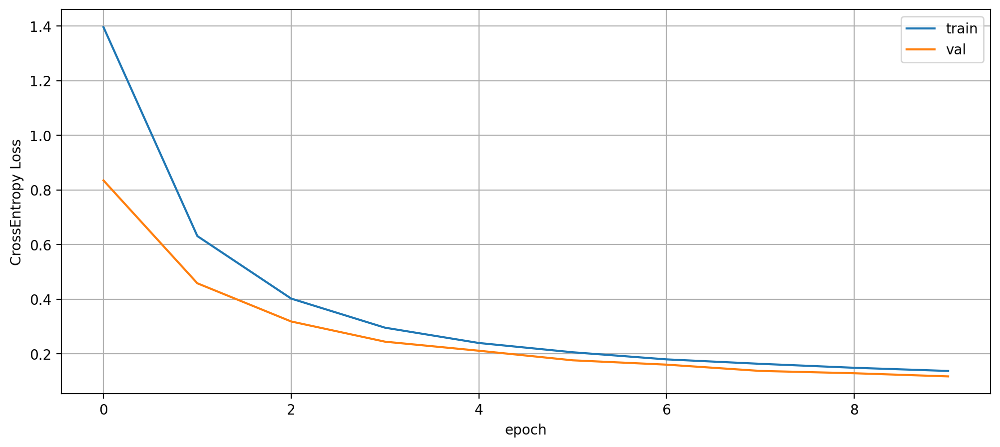

In [95]:
plt.figure(figsize=(12, 5))
plt.plot(losses, label="train")
plt.plot(val_losses, label="val")
plt.xlabel("epoch")
plt.ylabel("CrossEntropy Loss")
plt.legend()
plt.grid()
plt.show()

In [96]:
val_pred_labels = []
for val_pred in val_preds[-1]:
    pred_label = np.argmax(val_pred)
    val_pred_labels.append(pred_label)
val_pred_labels = np.asarray(val_pred_labels)

In [97]:
val_labels = []
for image, label in val_dataset:
    val_labels.append(label)
val_labels = np.asarray(val_labels)

In [98]:
acc = (val_pred_labels == val_labels).mean()
acc

np.float64(0.9659)

In [99]:
sample_indices = np.random.choice(len(val_dataset), size=64, replace=False)

sample_images = []
sample_captions = []
for i in sample_indices:
    image, label = val_dataset[i]
    pred_label = val_pred_labels[i]
    sample_images.append(image)
    sample_captions.append(f"gt: {label} | pred: {pred_label}")

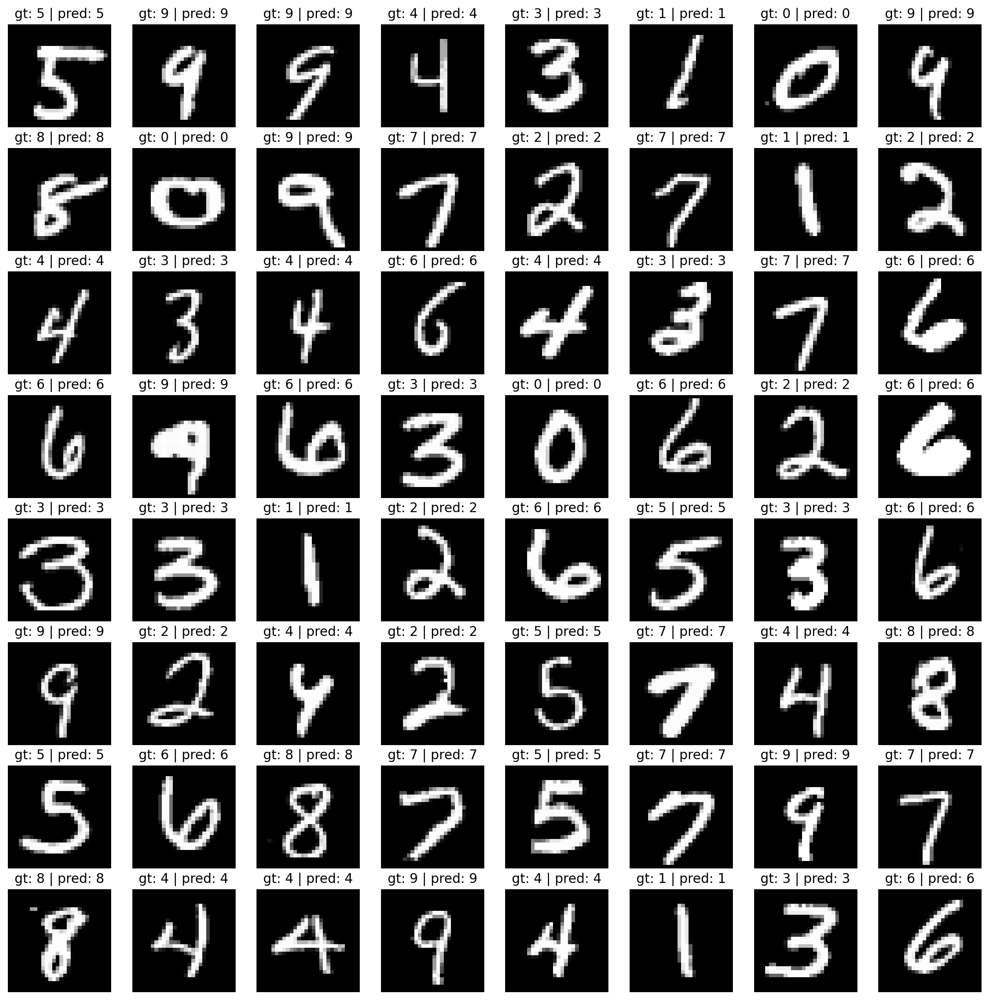

In [100]:
show_images_with_captions(sample_images, sample_captions)

Можем отдельно отрисовать те примеры из валидации, на которых модель ошибается:

In [101]:
sample_indices = np.random.choice(np.where(val_labels != val_pred_labels)[0], size=64, replace=False)

sample_images = []
sample_captions = []
for i in sample_indices:
    image, label = val_dataset[i]
    pred_label = val_pred_labels[i]
    sample_images.append(image)
    sample_captions.append(f"gt: {label} | pred: {pred_label}")

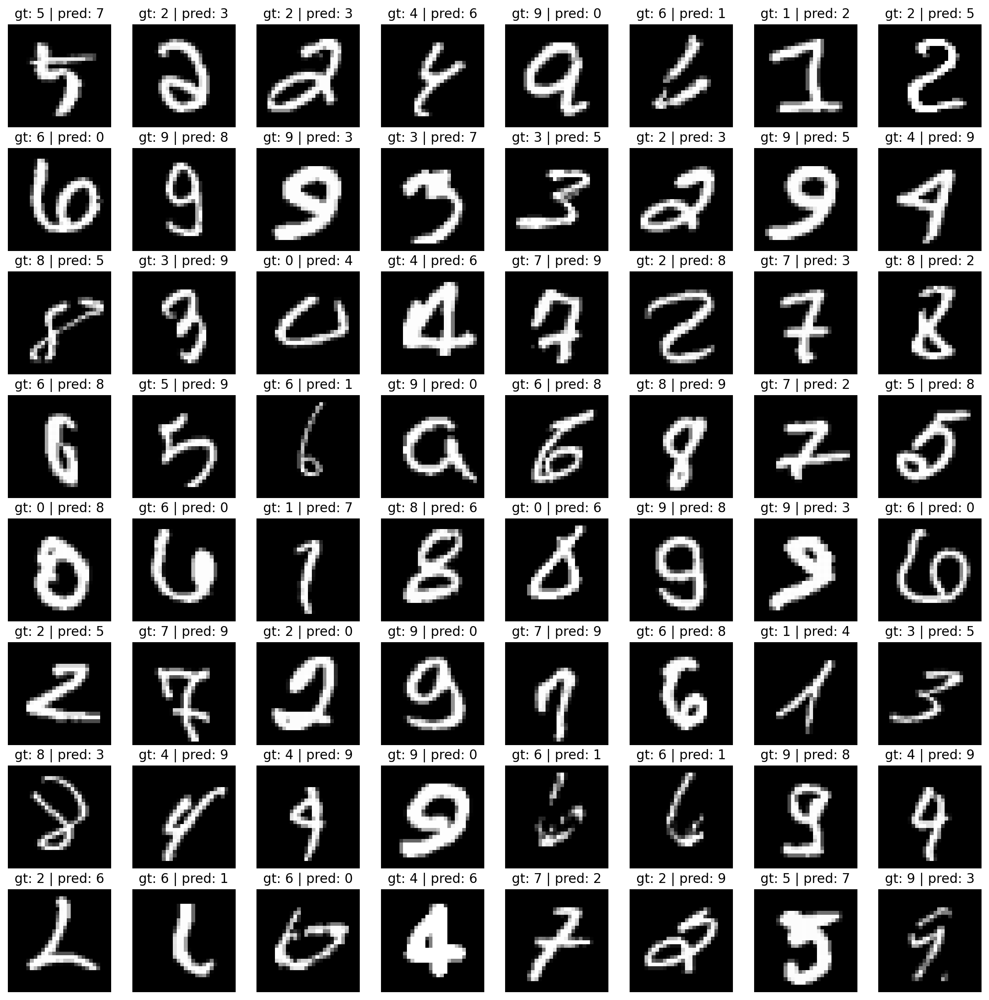

In [102]:
show_images_with_captions(sample_images, sample_captions)

In [103]:
print((val_labels != val_pred_labels).sum())

341


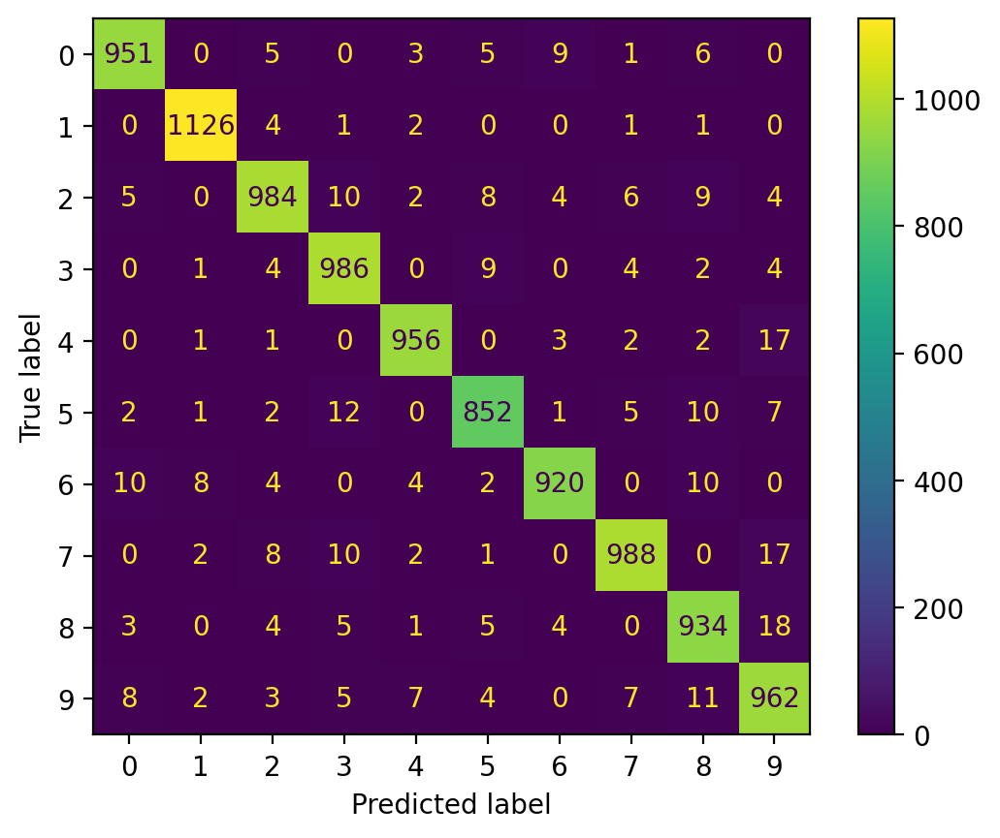

In [104]:
cm = confusion_matrix(val_labels, val_pred_labels)
disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
)
disp.plot();

Посмотрим, как обстоит дело с устойчивостью моделей, например, к смещениям:

In [105]:
def shift_image(image, min_shift=3, max_shift=6):
    shift = np.random.randint(min_shift, max_shift + 1)

    output = np.zeros_like(image)
    p = np.random.uniform()
    pad_left = pad_right = pad_top = pad_bottom = 0

    if p <= 0.25:  # <-
        output[:, :, :-shift] = image[:, :, shift:]
    elif p < 0.5:  # ->
        output[:, :, shift:] = image[:, :, :-shift]
    elif p < 0.75:  # ^
        output[:, :-shift, :] = image[:, shift:, :]
    else:  # v
        output[:, shift:, :] = image[:, :-shift, :]

    return output

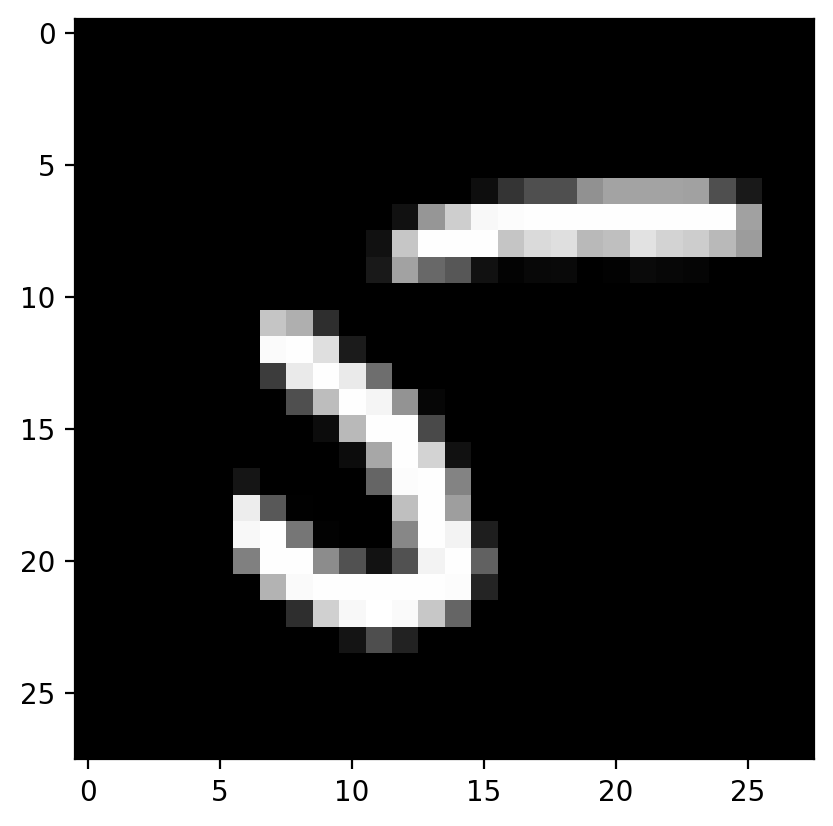

In [106]:
i = np.random.choice(len(val_dataset), size=1)[0]

image = val_dataset[i][0]
plt.imshow(image.permute(1, 2, 0), cmap="grey")

/var/folders/97/_c6jz2ls7dg064cmjfvhkvhw0000gn/T/ipykernel_75724/2308365486.py:9: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  output[:, :, :-shift] = image[:, :, shift:]


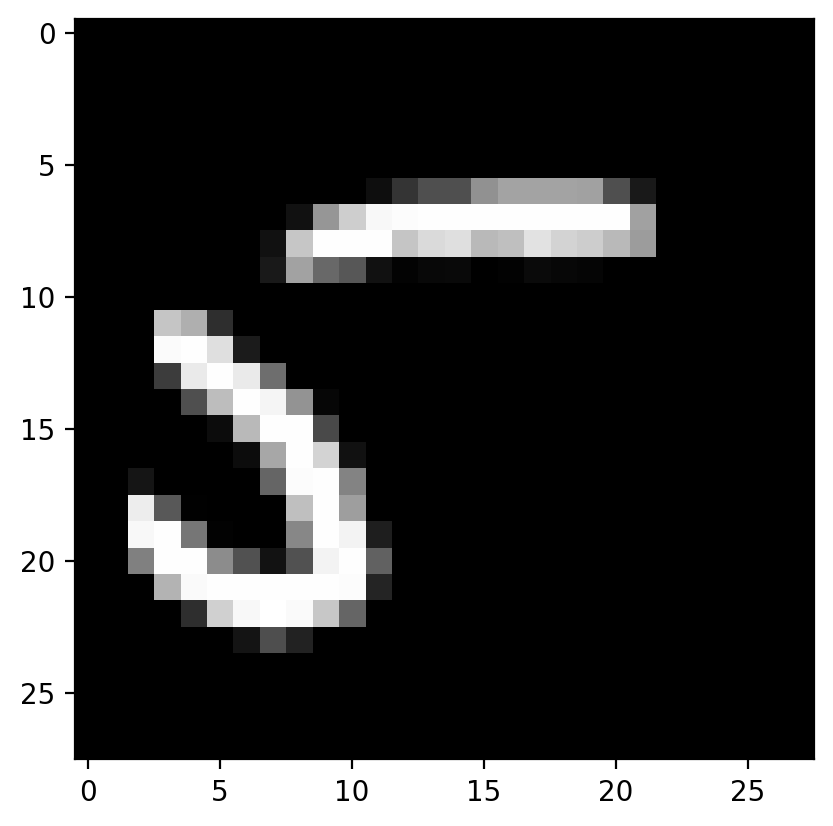

In [107]:
plt.imshow(shift_image(image).transpose(1, 2, 0), cmap="grey")

In [108]:
model.eval()
my_cnn.eval()

for j in range(10):
    tensor = torch.from_numpy(shift_image(image)).unsqueeze(0).to(device)

    with torch.no_grad():
        preds_fcn = model(tensor)
    label_fcn = preds_fcn.cpu().numpy().ravel().argmax()

    with torch.no_grad():
        preds_cnn = my_cnn(tensor)
    label_cnn = preds_cnn.cpu().numpy().ravel().argmax()

    print(label_fcn, label_cnn)

/var/folders/97/_c6jz2ls7dg064cmjfvhkvhw0000gn/T/ipykernel_75724/2308365486.py:11: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  output[:, :, shift:] = image[:, :, :-shift]


5 5
5 5
0 5
0 5
6 5
5 5
6 5
5 5
5 5
6 5


/var/folders/97/_c6jz2ls7dg064cmjfvhkvhw0000gn/T/ipykernel_75724/2308365486.py:9: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  output[:, :, :-shift] = image[:, :, shift:]
/var/folders/97/_c6jz2ls7dg064cmjfvhkvhw0000gn/T/ipykernel_75724/2308365486.py:15: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  output[:, shift:, :] = image[:, :-shift, :]
/var/folders/97/_c6jz2ls7dg064cmjfvhkvhw0000gn/T/ipykernel_75724/2308365486.py:13: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  output[:, :-shift, :] = image[:, shift:, :]


Как видим, природа сверточного слоя делает его более устойчивым к смещению (translation invariance), что и делает его таким полезным при работе с изображениями (и другими "вытянутыми" сигналами).

## 5. (bonus) Различные способы организации слоев в pytorch


In [109]:
from torch import nn

In [110]:
x = torch.randn(1, 1, 32, 32)

In [111]:
my_cnn_seq = nn.Sequential(  # b x 1 x 28 x 28
    nn.Conv2d(1, 8, (3, 3), 1, 1),  # b x 8 x 28 x 28
    nn.ReLU(inplace=True),  # ...
    nn.BatchNorm2d(8),  # ...
    nn.MaxPool2d((2, 2)),  # b x 8 x 14 x 14
    nn.Conv2d(8, 32, (3, 3), 1, 1),  # b x 32 x 14 x 14
    nn.ReLU(inplace=True),  # ...
    nn.BatchNorm2d(32),  # ...
    nn.MaxPool2d((2, 2)),  # b x 32 x 7 x 7
    nn.Conv2d(32, 64, (3, 3), 1, 1),  # b x 64 x 7 x 7
    nn.ReLU(inplace=True),  # ...
    nn.AvgPool2d((7, 7)),  # b x 64 x 1 x 1
    nn.Flatten(),  # b x 64
    nn.Linear(64, 10),  # b x 10
)

In [112]:
class MyCNNBlock(nn.Module):
    def __init__(self, in_features, out_features, relu=True, bn=True, maxpool=True):
        super().__init__()

        self.conv = nn.Conv2d(in_features, out_features, (3, 3), 1, 1)
        self.relu = nn.ReLU(inplace=True) if relu else nn.Identity()
        self.bn = nn.BatchNorm2d(out_features) if bn else nn.Identity()
        self.maxpool = nn.MaxPool2d((2, 2)) if maxpool else nn.Identity()

    def forward(self, x):
        y1 = self.conv(x)
        y2 = self.relu(y1)
        y3 = self.bn(y2)
        y4 = self.maxpool(y3)
        return y4

In [113]:
block = MyCNNBlock(1, 8)
block(x).shape

torch.Size([1, 8, 16, 16])

* Больше гибкости в работе с промежуточными значениями
* Можно делать "непрямое" течение тензоров (ResNet)
* Проще эксперименты

In [114]:
my_cnn_blocked = nn.Sequential(
    MyCNNBlock(1, 8),
    MyCNNBlock(8, 32),
    MyCNNBlock(32, 64, bn=False, maxpool=False),
    nn.AvgPool2d((7, 7)),  # b x 64 x 1 x 1
    nn.Flatten(),  # b x 64
    nn.Linear(64, 10),  # b x 10
)

In [115]:
my_cnn_seq

Sequential(
  (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (3): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (4): Conv2d(8, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (5): ReLU(inplace=True)
  (6): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (7): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (8): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (9): ReLU(inplace=True)
  (10): AvgPool2d(kernel_size=(7, 7), stride=(7, 7), padding=0)
  (11): Flatten(start_dim=1, end_dim=-1)
  (12): Linear(in_features=64, out_features=10, bias=True)
)

In [116]:
my_cnn_blocked

Sequential(
  (0): MyCNNBlock(
    (conv): Conv2d(1, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU(inplace=True)
    (bn): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (maxpool): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  )
  (1): MyCNNBlock(
    (conv): Conv2d(8, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU(inplace=True)
    (bn): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (maxpool): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  )
  (2): MyCNNBlock(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU(inplace=True)
    (bn): Identity()
    (maxpool): Identity()
  )
  (3): AvgPool2d(kernel_size=(7, 7), stride=(7, 7), padding=0)
  (4): Flatten(start_dim=1, end_dim=-1)
  (5): Linear(in_features=64, out_features=10, bias=True)
)

In [117]:
my_cnn_blocked(x)

tensor([[ 0.1194,  0.1804,  0.0955,  0.5393,  0.3637, -0.2748, -0.4692,  0.1775,
         -0.0778,  0.2291]], grad_fn=<AddmmBackward0>)

In [118]:
class MyModuleListBlock(nn.Module):
    def __init__(self):
        super().__init__()
        self.some_parameter_tensor = nn.Parameter(torch.ones(100))
        self.some_tensor = torch.ones(100)
        self.linears = nn.ModuleList([nn.Linear(10, 10) for i in range(2)])
        self.list_linears = [nn.Linear(10, 10) for i in range(2)]
        self.dict_linears = {"linear1": nn.Linear(10, 10), "linear2": nn.Linear(10, 10)}

    def forward(self, x):
        # ModuleList can act as an iterable, or be indexed using ints
        for i, l in enumerate(self.linears):
            x = self.linears[i // 2](x) + l(x)
        return x

In [119]:
ml_block = MyModuleListBlock()
ml_block.linears[2:4]

ModuleList()

In [120]:
[name for name, param in ml_block.named_parameters()]

['some_parameter_tensor',
 'linears.0.weight',
 'linears.0.bias',
 'linears.1.weight',
 'linears.1.bias']

In [121]:
ml_block.to("mps")

MyModuleListBlock(
  (linears): ModuleList(
    (0-1): 2 x Linear(in_features=10, out_features=10, bias=True)
  )
)

In [122]:
ml_block.some_parameter_tensor.device, ml_block.some_tensor.device,

(device(type='mps', index=0), device(type='cpu'))

In [123]:
class MyModuleDictBlock(nn.Module):
    def __init__(self):
        super().__init__()
        self.choices = nn.ModuleDict({"conv": nn.Conv2d(10, 10, 3), "pool": nn.MaxPool2d(3)})
        self.activations = nn.ModuleDict([["lrelu", nn.LeakyReLU()], ["prelu", nn.PReLU()]])

    def forward(self, x, choice, act):
        x = self.choices[choice](x)
        x = self.activations[act](x)
        return x

In [124]:
md_block = MyModuleDictBlock()
md_block.choices["conv"]

Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1))

In [125]:
[name for name, param in md_block.named_parameters()]

['choices.conv.weight', 'choices.conv.bias', 'activations.prelu.weight']